In [1]:
import os
from glob import glob
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tensorflow as tf

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("agungmrf/indonesian-sign-language-bisindo")

print("Path to dataset files:", path)

100%|██████████| 1.36G/1.36G [00:50<00:00, 28.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/agungmrf/indonesian-sign-language-bisindo/versions/1


In [3]:
path_train = '/root/.cache/kagglehub/datasets/agungmrf/indonesian-sign-language-bisindo/versions/1/bisindo/images/train'

In [29]:
data = []
for label in os.listdir(path_train):
    folder_path = os.path.join(path_train, label)
    if os.path.isdir(folder_path):
        for file in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file)
            data.append({"file_path": file_path, "label": label})

train_df = pd.DataFrame(data)

In [5]:
dirList = os.listdir(path_train)
len(dirList), dirList

(26,
 ['K',
  'W',
  'O',
  'Z',
  'U',
  'F',
  'H',
  'V',
  'A',
  'T',
  'D',
  'Q',
  'X',
  'S',
  'G',
  'L',
  'N',
  'M',
  'C',
  'B',
  'I',
  'J',
  'E',
  'R',
  'P',
  'Y'])

In [6]:
TotalImages = 0
imgCounter = {}
for i in dirList:
    imgCounter[i] = len(os.listdir(path_train + '/' + i))
    TotalImages += imgCounter[i]

classImg = pd.DataFrame(imgCounter.values(), index=imgCounter.keys(), columns=['images'])

print('Total Selected Images', TotalImages)
classImg

Total Selected Images 9169


,images
K,348
W,360
O,357
Z,360
U,355
F,357
H,348
V,357
A,350
T,360


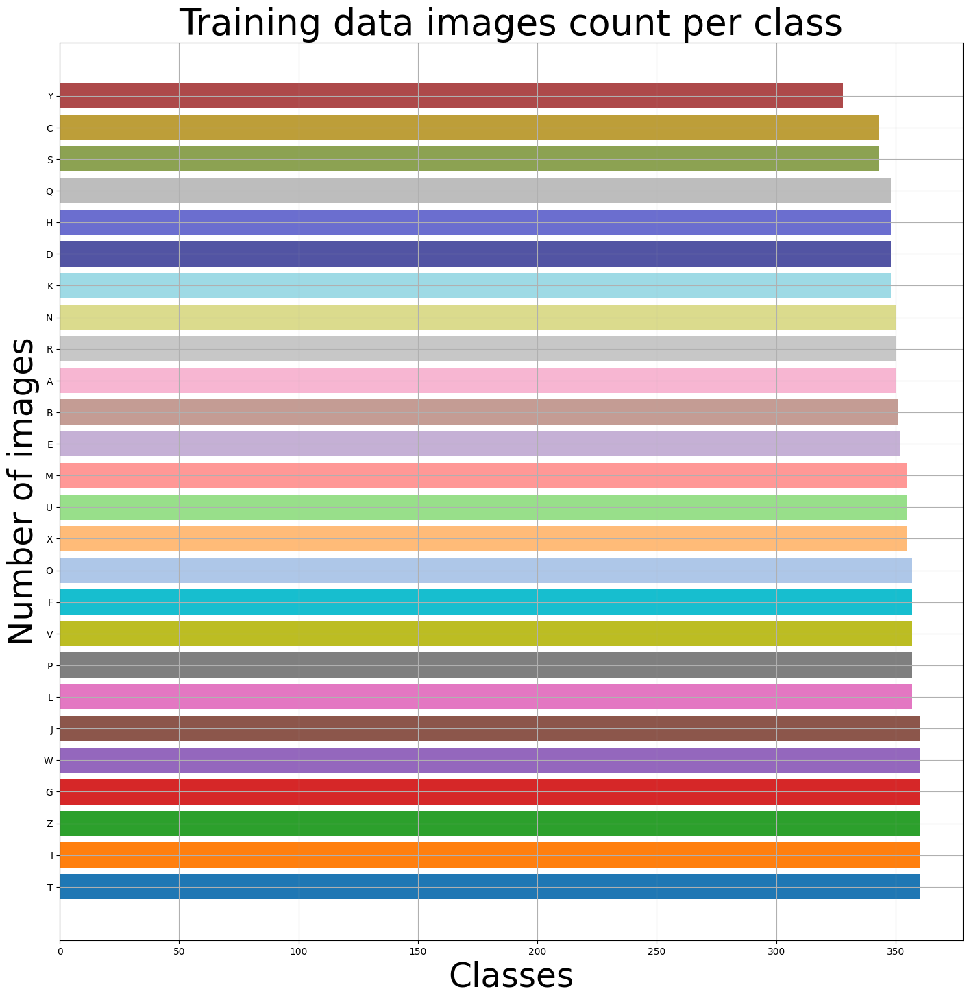

In [35]:
train  = train_df["label"].value_counts()
label = train.tolist()
index = train.index.tolist()

colors = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
    "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
    "#aec7e8", "#ffbb78", "#98df8a", "#ff9896", "#c5b0d5",
    "#c49c94", "#f7b6d2", "#c7c7c7", "#dbdb8d", "#9edae5",
    "#5254a3", "#6b6ecf", "#bdbdbd", "#8ca252", "#bd9e39",
    "#ad494a", "#8c6d31", "#6b6ecf", "#e7ba52", "#ce6dbd",
    "#9c9ede", "#cedb9c", "#de9ed6", "#ad494a", "#d6616b",
    "#f7f7f7", "#7b4173", "#a55194", "#ce6dbd"
]



plt.figure(figsize=(17,17))
plt.title("Training data images count per class",fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)
plt.barh(index,label, color=colors)
plt.grid(True)
plt.show()

Label (textual): K


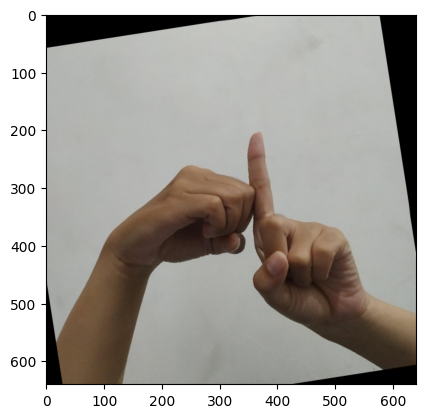

In [16]:
image_path = train_df.iloc[9]['file']
label = train_df.iloc[6]['labels']

img = Image.open(os.path.join(path_train, label, image_path))

plt.imshow(img)
print('Label (textual):', label)

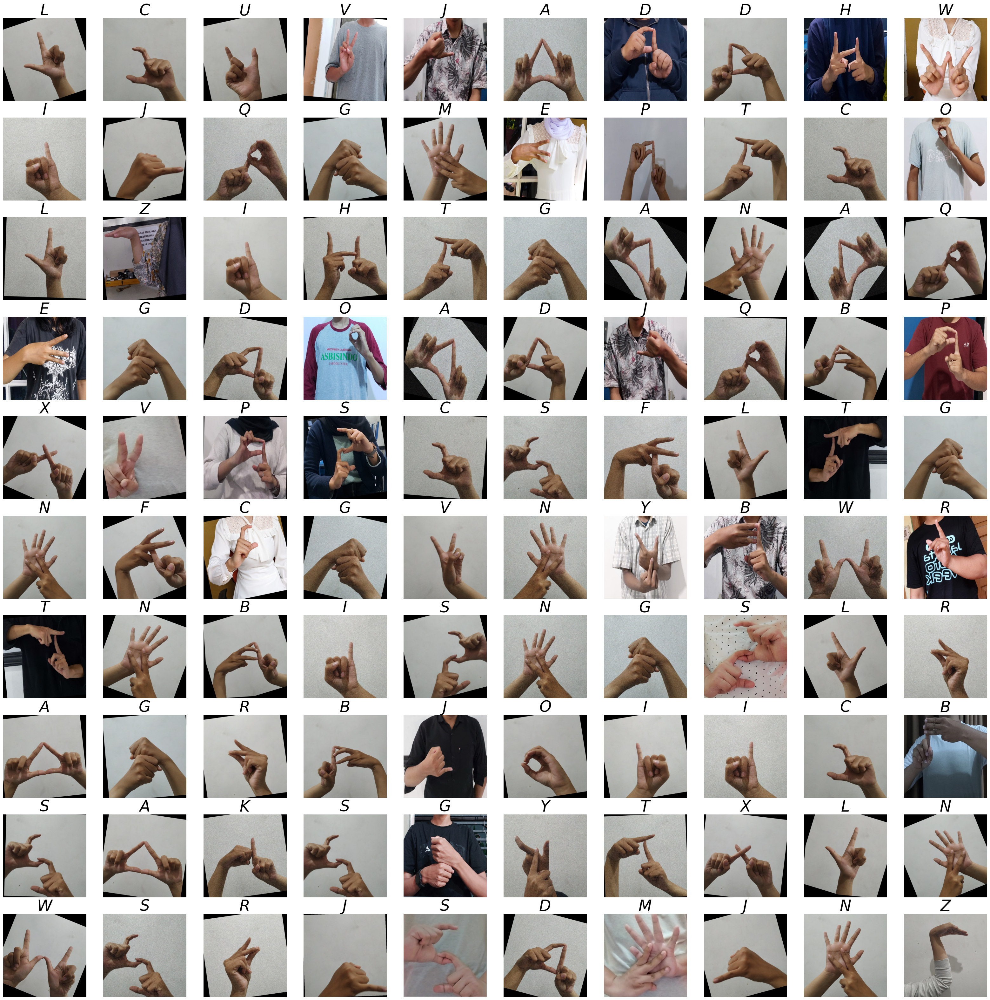

In [31]:
plt.figure(figsize=(40, 40))

for i, row in train_df.sample(n=100).reset_index().iterrows():
    img = plt.imread(row["file_path"])
    plt.subplot(10, 10, i + 1)
    plt.imshow(img)
    plt.title(row["label"], fontsize=35, fontstyle='italic')
    plt.axis("off")

plt.show()

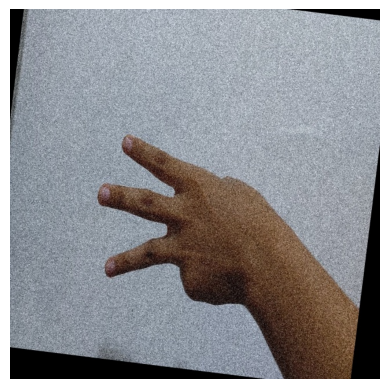

File Path: /root/.cache/kagglehub/datasets/agungmrf/indonesian-sign-language-bisindo/versions/1/bisindo/images/train/E/rotate044.jpg
Image Format: JPEG
Image Size: 640 x 640 pixels
Total Pixels: 409600
Image Mode: RGB


In [37]:
# Fungsi untuk menampilkan detail gambar
def display_image_details(image_path):
    with Image.open(image_path) as img:
        # Menampilkan gambar
        plt.imshow(img)
        plt.axis("off")
        plt.show()

        # Mendapatkan ukuran dan jumlah piksel
        width, height = img.size
        num_pixels = width * height

        # Menampilkan detail
        print(f"File Path: {image_path}")
        print(f"Image Format: {img.format}")
        print(f"Image Size: {width} x {height} pixels")
        print(f"Total Pixels: {num_pixels}")
        print(f"Image Mode: {img.mode}")

sample_image_path = train_df.sample(n=1)["file_path"].values[0]
display_image_details(sample_image_path)